In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from xgboost import XGBClassifier
from sklearn.ensemble import AdaBoostClassifier, GradientBoostingClassifier, RandomForestClassifier

from sklearn.metrics import roc_auc_score, accuracy_score, classification_report, recall_score, confusion_matrix

from sklearn.model_selection import cross_val_score, KFold
import warnings
warnings.filterwarnings("ignore")

In [2]:
df = pd.read_csv("/kaggle/input/creditcardfraud/creditcard.csv")

In [3]:
df

,Time,V1,V2,V3,V4,V5,V6,V7,V8,V9,...,V21,V22,V23,V24,V25,V26,V27,V28,Amount,Class
0,0.0,-1.359807,-0.072781,2.536347,1.378155,-0.338321,0.462388,0.239599,0.098698,0.363787,...,-0.018307,0.277838,-0.110474,0.066928,0.128539,-0.189115,0.133558,-0.021053,149.62,0
1,0.0,1.191857,0.266151,0.166480,0.448154,0.060018,-0.082361,-0.078803,0.085102,-0.255425,...,-0.225775,-0.638672,0.101288,-0.339846,0.167170,0.125895,-0.008983,0.014724,2.69,0
2,1.0,-1.358354,-1.340163,1.773209,0.379780,-0.503198,1.800499,0.791461,0.247676,-1.514654,...,0.247998,0.771679,0.909412,-0.689281,-0.327642,-0.139097,-0.055353,-0.059752,378.66,0
3,1.0,-0.966272,-0.185226,1.792993,-0.863291,-0.010309,1.247203,0.237609,0.377436,-1.387024,...,-0.108300,0.005274,-0.190321,-1.175575,0.647376,-0.221929,0.062723,0.061458,123.50,0
4,2.0,-1.158233,0.877737,1.548718,0.403034,-0.407193,0.095921,0.592941,-0.270533,0.817739,...,-0.009431,0.798278,-0.137458,0.141267,-0.206010,0.502292,0.219422,0.215153,69.99,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
284802,172786.0,-11.881118,10.071785,-9.834783,-2.066656,-5.364473,-2.606837,-4.918215,7.305334,1.914428,...,0.213454,0.111864,1.014480,-0.509348,1.436807,0.250034,0.943651,0.823731,0.77,0
284803,172787.0,-0.732789,-0.055080,2.035030,-0.738589,0.868229,1.058415,0.024330,0.294869,0.584800,...,0.214205,0.924384,0.012463,-1.016226,-0.606624,-0.395255,0.068472,-0.053527,24.79,0
284804,172788.0,1.919565,-0.301254,-3.249640,-0.557828,2.630515,3.031260,-0.296827,0.708417,0.432454,...,0.232045,0.578229,-0.037501,0.640134,0.265745,-0.087371,0.004455,-0.026561,67.88,0
284805,172788.0,-0.240440,0.530483,0.702510,0.689799,-0.377961,0.623708,-0.686180,0.679145,0.392087,...,0.265245,0.800049,-0.163298,0.123205,-0.569159,0.546668,0.108821,0.104533,10.00,0


In [4]:
amount_column = df["Amount"]
df.drop("Amount", axis = 1, inplace = True)
df.insert(1, "Amount", amount_column)
df

,Time,Amount,V1,V2,V3,V4,V5,V6,V7,V8,...,V20,V21,V22,V23,V24,V25,V26,V27,V28,Class
0,0.0,149.62,-1.359807,-0.072781,2.536347,1.378155,-0.338321,0.462388,0.239599,0.098698,...,0.251412,-0.018307,0.277838,-0.110474,0.066928,0.128539,-0.189115,0.133558,-0.021053,0
1,0.0,2.69,1.191857,0.266151,0.166480,0.448154,0.060018,-0.082361,-0.078803,0.085102,...,-0.069083,-0.225775,-0.638672,0.101288,-0.339846,0.167170,0.125895,-0.008983,0.014724,0
2,1.0,378.66,-1.358354,-1.340163,1.773209,0.379780,-0.503198,1.800499,0.791461,0.247676,...,0.524980,0.247998,0.771679,0.909412,-0.689281,-0.327642,-0.139097,-0.055353,-0.059752,0
3,1.0,123.50,-0.966272,-0.185226,1.792993,-0.863291,-0.010309,1.247203,0.237609,0.377436,...,-0.208038,-0.108300,0.005274,-0.190321,-1.175575,0.647376,-0.221929,0.062723,0.061458,0
4,2.0,69.99,-1.158233,0.877737,1.548718,0.403034,-0.407193,0.095921,0.592941,-0.270533,...,0.408542,-0.009431,0.798278,-0.137458,0.141267,-0.206010,0.502292,0.219422,0.215153,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
284802,172786.0,0.77,-11.881118,10.071785,-9.834783,-2.066656,-5.364473,-2.606837,-4.918215,7.305334,...,1.475829,0.213454,0.111864,1.014480,-0.509348,1.436807,0.250034,0.943651,0.823731,0
284803,172787.0,24.79,-0.732789,-0.055080,2.035030,-0.738589,0.868229,1.058415,0.024330,0.294869,...,0.059616,0.214205,0.924384,0.012463,-1.016226,-0.606624,-0.395255,0.068472,-0.053527,0
284804,172788.0,67.88,1.919565,-0.301254,-3.249640,-0.557828,2.630515,3.031260,-0.296827,0.708417,...,0.001396,0.232045,0.578229,-0.037501,0.640134,0.265745,-0.087371,0.004455,-0.026561,0
284805,172788.0,10.00,-0.240440,0.530483,0.702510,0.689799,-0.377961,0.623708,-0.686180,0.679145,...,0.127434,0.265245,0.800049,-0.163298,0.123205,-0.569159,0.546668,0.108821,0.104533,0


# **IMBALANCE DATASET**

In [5]:
# Class imbalance
print(f'length of class 0: {len(df[df["Class"] == 0])} \nlength of class 1: {len(df[df["Class"] == 1])}')

length of class 0: 284315 
length of class 1: 492



**As we can see the data is highly imbalance so we can select the equal amount of data of FRAUD cases and NON-FRAUD cases.we can also take benifit of the random state so that we can find which random data is best for the model to get the highest score**


**Finding which model can get the best score using the confusion matrix**

In [6]:
classifiers = {
    "LogisticRegression": LogisticRegression(),
    "XGBoost": XGBClassifier(),
    "KNearest": KNeighborsClassifier(),
    "Support Vector Classifier": SVC(),
    "DecisionTreeClassifier": DecisionTreeClassifier(),
    "ADABoost": AdaBoostClassifier(),
    "Gradient Boosting": GradientBoostingClassifier(),
    "Random Forest": RandomForestClassifier()
}

0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

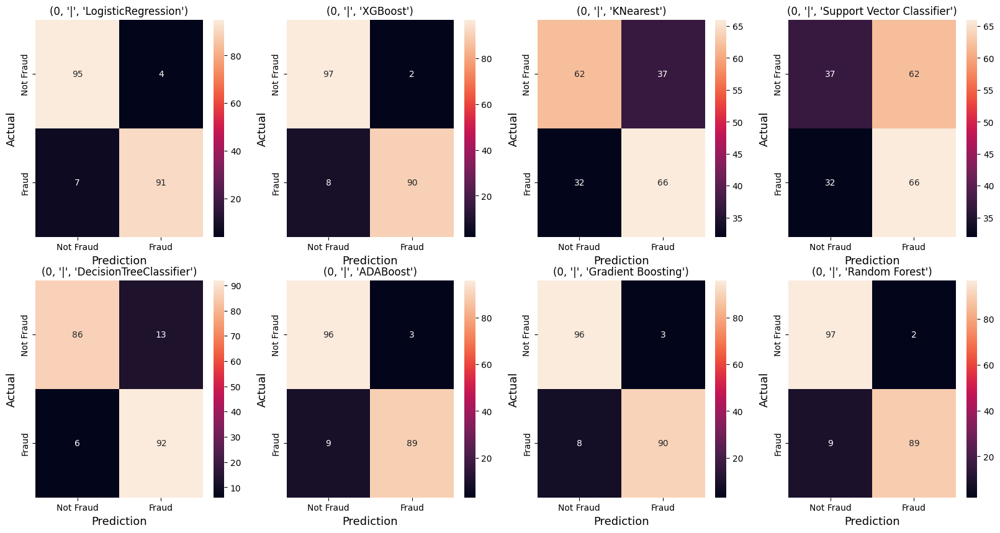

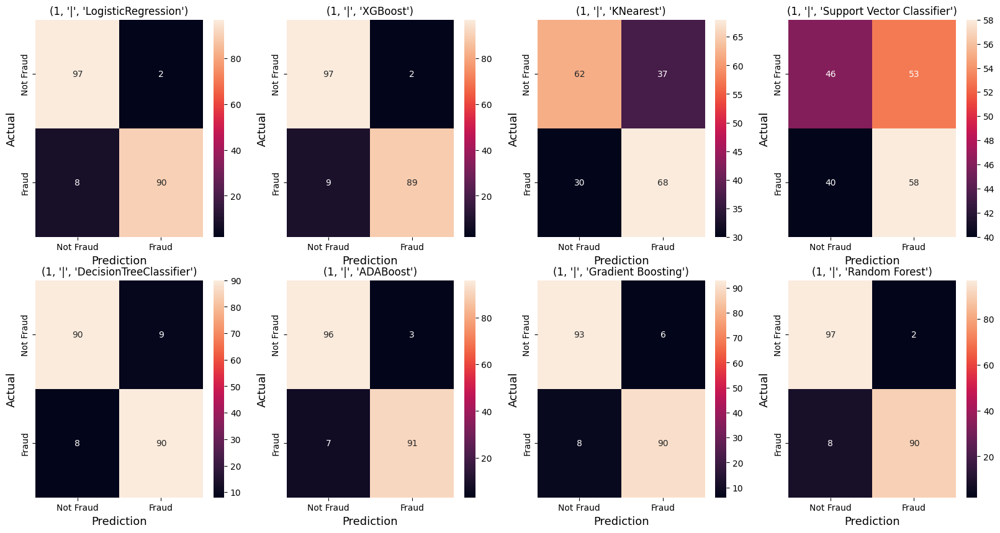

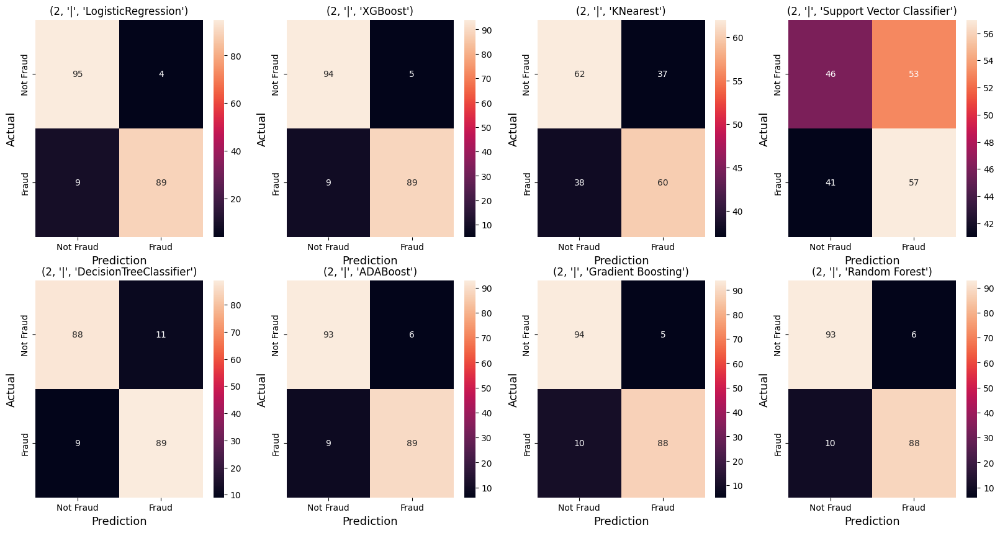

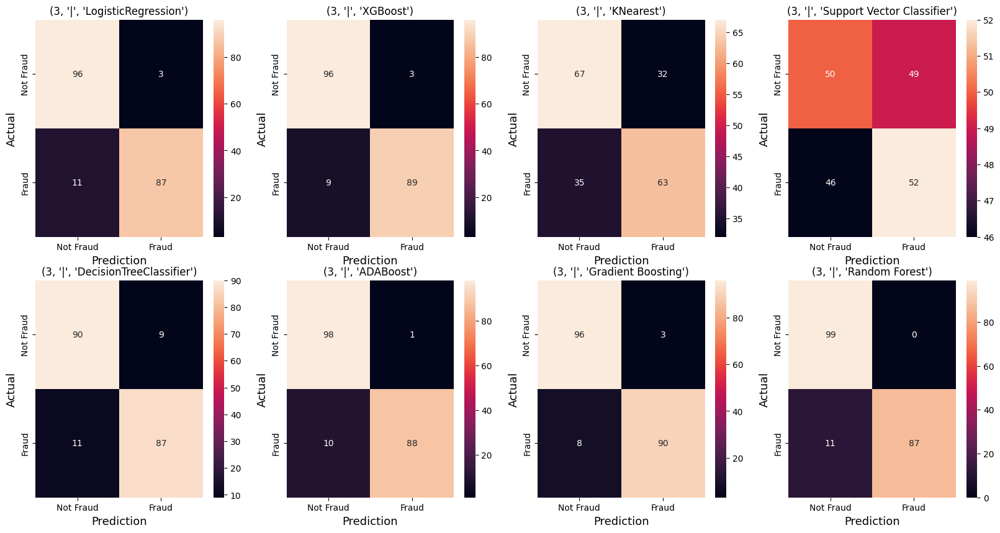

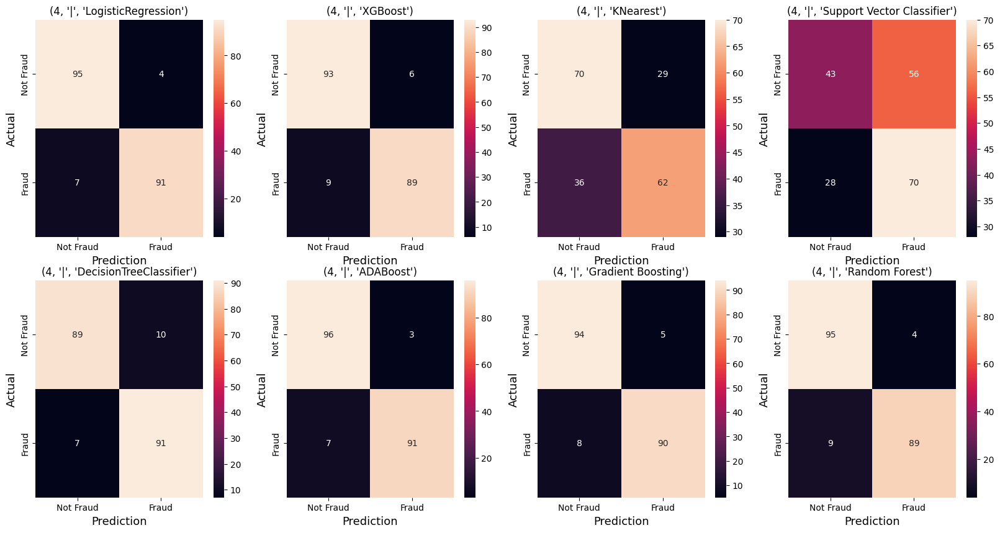

...

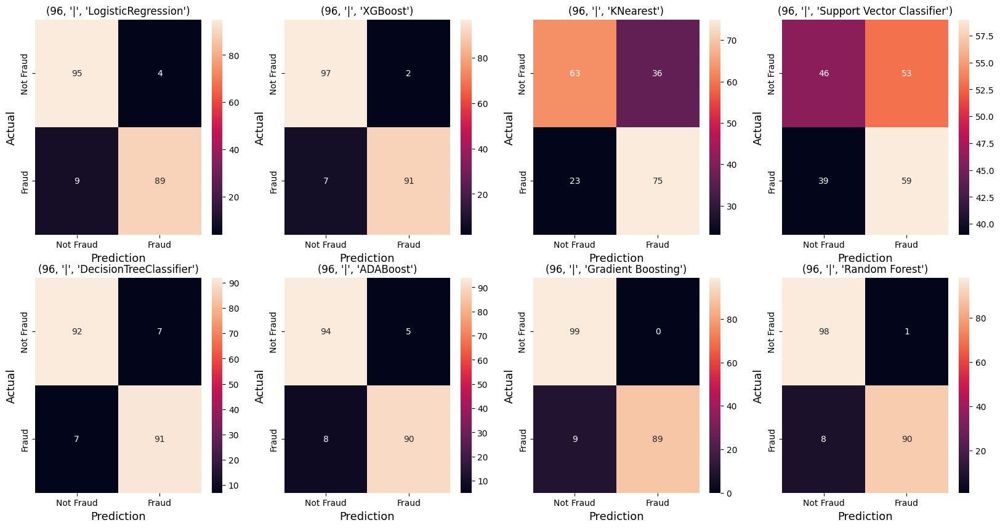

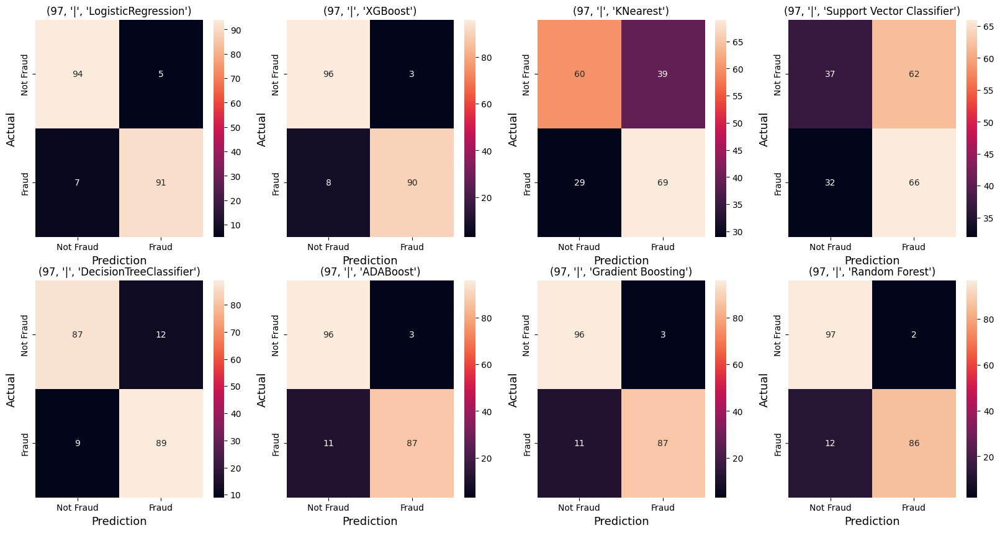

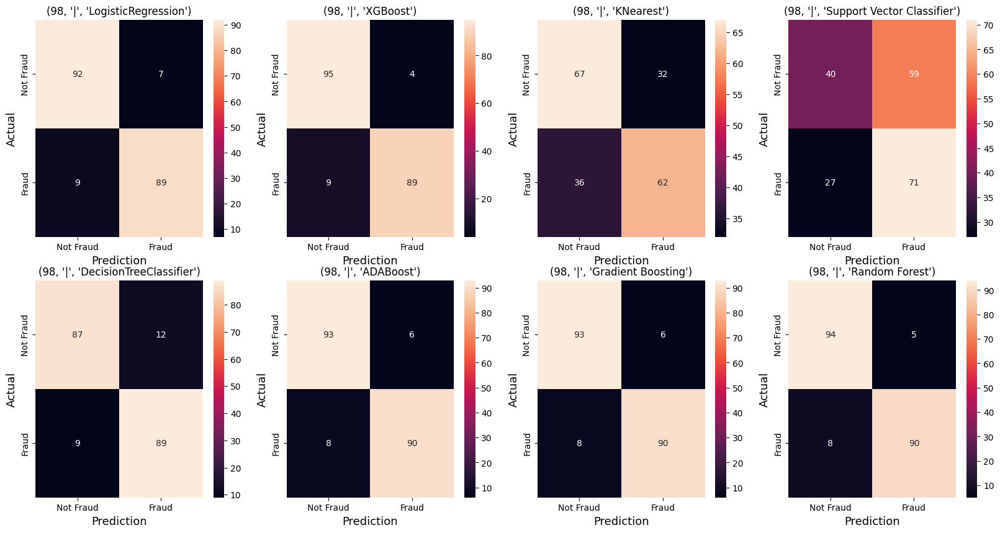

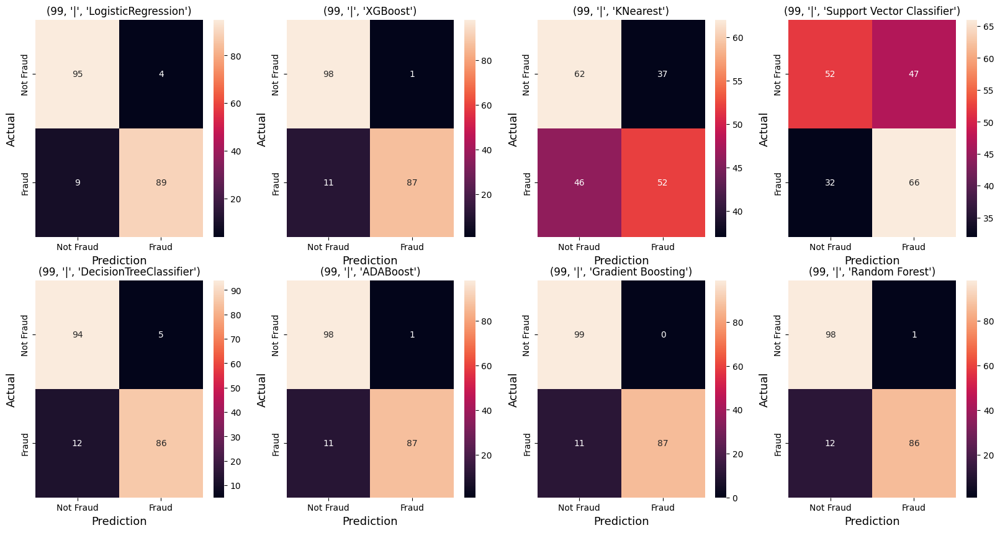

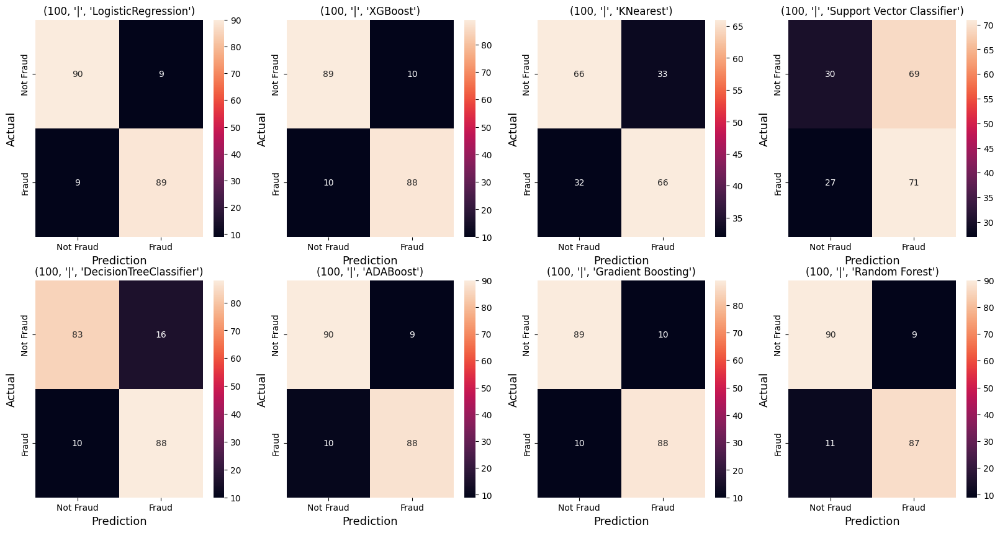

In [7]:
#31 
from tqdm.notebook import tqdm
from sklearn.model_selection import train_test_split
d = pd.DataFrame(columns = classifiers.keys())

for RANDOM_STATE in range(0,101):
    
    new_df = pd.concat([df[df["Class"] == 1], df[df["Class"] == 0].sample(492, random_state = RANDOM_STATE)]).sample(984, random_state = RANDOM_STATE)
    X = new_df.drop("Class", axis = 1)
    y = new_df["Class"]
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, random_state = 42, stratify = y)
    
    plt.figure(figsize = (20, 10))
    recall_dict = {}
    for i, (model_name, model) in tqdm(enumerate(classifiers.items())):
        model.fit(X_train, y_train)
        preds = model.predict(X_test)
        recall = recall_score(y_test, preds)
        recall_dict[model_name] = recall
        cm = confusion_matrix(y_test,preds)
        plt.subplot(2,4, i+1)
        sns.heatmap(cm, annot=True,fmt='g', xticklabels=['Not Fraud','Fraud'],yticklabels=['Not Fraud','Fraud'])
        plt.title((RANDOM_STATE, "|", model_name))
        plt.ylabel('Actual', fontsize=13)
        plt.xlabel('Prediction', fontsize=13)
    d.loc[RANDOM_STATE] = recall_dict

**You can also see the confusion matrix graph here ☝️ and compare all the models we are using the LOGISTIC REGRESSION model because it has the highest recall score**

In [8]:
random_state = d[d["LogisticRegression"] == max(d["LogisticRegression"])].index[0]
print(f"At this Random State: '{random_state}' we are getting the highest recall score: '{max(d["LogisticRegression"])}'")

At this Random State: '23' we are getting the highest recall score: '0.9693877551020408'


**So now we will use this random state for getting the best model**

In [9]:
# Creating new balanced dataset
new_df = pd.concat([df[df["Class"] == 1], df[df["Class"] == 0].sample(492, random_state = random_state)]).sample(984,random_state = random_state)
new_df

,Time,Amount,V1,V2,V3,V4,V5,V6,V7,V8,...,V20,V21,V22,V23,V24,V25,V26,V27,V28,Class
154697,102625.0,7.59,-4.221221,2.871121,-5.888716,6.890952,-3.404894,-1.154394,-7.739928,2.851363,...,-0.227882,1.620591,1.567947,-0.578007,-0.059045,-1.829169,-0.072429,0.136734,-0.599848,1
64329,51112.0,99.99,-9.848776,7.365546,-12.898538,4.273323,-7.611991,-3.427045,-8.350808,6.863604,...,0.832398,0.931958,-0.874467,-0.192639,-0.035426,0.538665,-0.263934,1.134095,0.225973,1
41569,40742.0,1.00,-2.377533,0.520539,-8.094139,8.005351,2.640750,-3.381586,-1.934372,0.562322,...,-0.634747,0.148284,0.721100,2.661291,-0.508620,-0.401657,0.587611,0.500326,0.551760,1
183007,125617.0,61.51,-0.577191,1.216703,-1.497878,0.940444,4.067955,3.792288,1.518483,0.718805,...,-0.383330,0.242826,0.549024,-0.088836,0.685917,-0.035748,-0.137082,0.029663,0.153841,0
230076,146179.0,0.77,-0.067672,4.251181,-6.540388,7.283657,0.513541,-2.635066,-1.865911,0.780272,...,0.519404,0.415437,-0.469938,0.007128,-0.388147,-0.493398,0.466468,0.566370,0.262990,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
263589,161026.0,39.60,-1.002327,0.740390,0.299259,-0.484377,0.773084,-1.162707,1.411690,-0.486701,...,-0.042615,-0.156184,-0.123114,0.116941,-0.094410,0.060729,-0.065294,-0.622682,-0.324956,0
207274,136598.0,49.99,-0.923531,1.077646,-0.136695,-0.312489,-0.058498,-1.841269,1.158962,-0.009558,...,-0.227343,0.132258,0.435892,-0.109510,0.984981,-0.319272,0.422146,0.131291,0.095897,0
10497,17220.0,3.79,1.189784,0.942289,0.082334,3.024050,0.412406,-0.214415,0.053558,-0.110353,...,-0.143435,-0.502636,-1.047398,-0.056752,-0.340688,0.541235,-0.098300,-0.003041,0.049819,1
101025,67703.0,50.35,1.338151,-0.720431,0.507986,-0.735699,-1.067430,-0.307218,-0.761060,-0.071103,...,-0.333622,-0.500491,-1.062491,0.059564,-0.449482,0.011835,0.903747,-0.037705,0.020747,0


<Axes: >

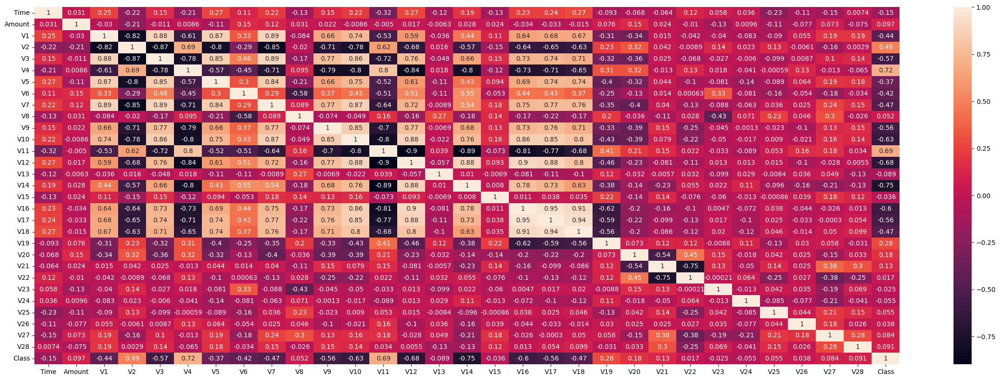

In [10]:
plt.figure(figsize = (30, 10))
sns.heatmap(new_df.corr(), annot = True)

In [11]:
positive_correlation = ['V2', 'V4', 'V11']
negative_correlation = ['V1', 'V3', 'V5', 'V6', 'V7', 'V9', 'V10', 'V12', 'V14', 'V16', 'V17', 'V18']
print(f"positive correlation: {positive_correlation}")
print(f"negative correlation: {negative_correlation}")

positive correlation: ['V2', 'V4', 'V11']
negative correlation: ['V1', 'V3', 'V5', 'V6', 'V7', 'V9', 'V10', 'V12', 'V14', 'V16', 'V17', 'V18']


**These Columns are showing the most correlation with the output class**

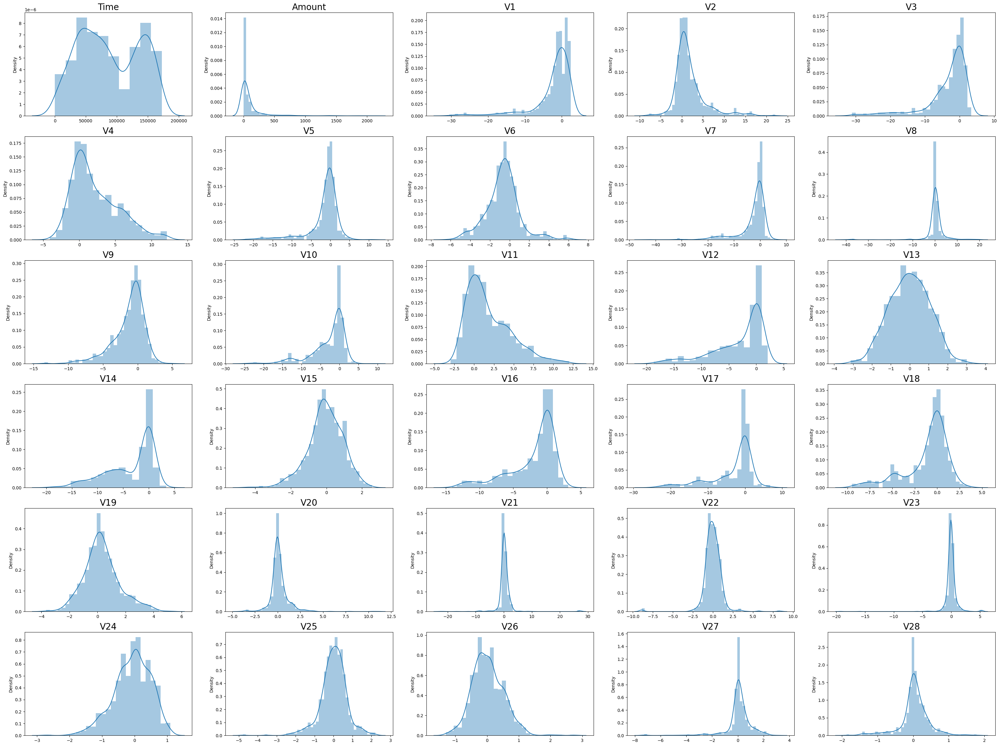

In [12]:
columns = new_df.columns[:-1]

plt.figure(figsize = (40, 30))
for i, column_name in enumerate(columns):
    plt.subplot(6, 5, i+1)
    sns.distplot(new_df[column_name])
    plt.title(column_name, fontsize=20)
    plt.xlabel("")

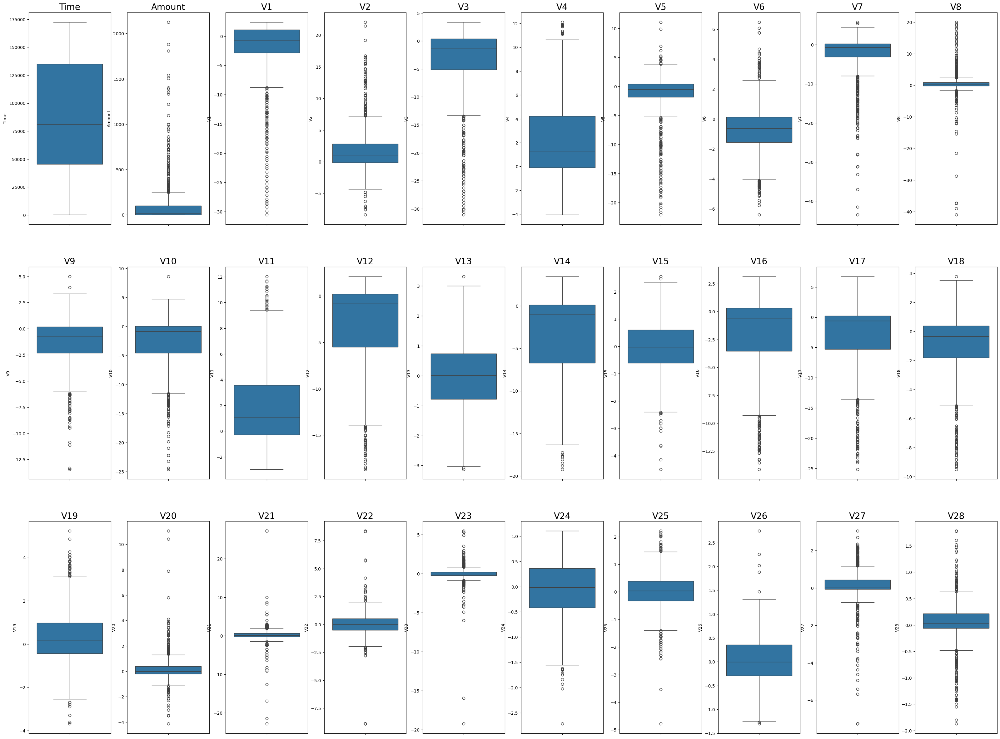

In [13]:
plt.figure(figsize = (40, 30))
for i, column_name in enumerate(columns):
    plt.subplot(3, 10, i+1)
    sns.boxplot(new_df[column_name])
    plt.title(column_name, fontsize=20)
    plt.xlabel("")

**Most of the column have outliers and when i try to remove the outliers then the data which is remaining is very less and also there is a huge imbalance in the dataset so i decided to keep the outliers**

**You can try the below code to remove the outliers using IQR method**

In [14]:
# for column in columns:
#     q1 = df[column].quantile(0.25)
#     q3 = df[column].quantile(0.75)
#     iqr = q3 - q1
    
#     print(f"{column}: \n  Q1: {q1}\n  Q3: {q3}\n  IQR: {iqr}")
    
#     upper_limit = q3 + (1.5 * iqr)
#     lower_limit = q3 - (1.5 * iqr)
#     print(f"Upper Limit: {upper_limit} Lower Limit: {lower_limit}")
    
#   # df = df.drop(df.loc[(df[column] < upper_limit) | (df[column] < lower_limit)].index) # THIS IS FOR REMOVING THE OUTLIERS COMPELETLY

######   THIS IS FOR CAPPING THE UPPER LIMIT AND LOWER LIMIT so you can choose whether you want to 'remove' the outlier or you can just 'cap' them

#   # df[column] = df[df[column] > upper_limit][column] = upper_limit 
#   # df[column] = df[df[column] > lower_limit][column] = lower_limit

In [15]:
from sklearn.model_selection import train_test_split
X = new_df.drop("Class", axis = 1)
y = new_df["Class"]
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, random_state = 42, stratify = y)

In [16]:
X_train

,Time,Amount,V1,V2,V3,V4,V5,V6,V7,V8,...,V19,V20,V21,V22,V23,V24,V25,V26,V27,V28
77640,57144.0,11.50,-1.627054,0.848379,1.554179,0.240670,-0.898131,0.265437,-0.924256,1.146616,...,-0.014622,-0.361397,0.220355,0.507841,-0.084348,0.288449,-0.665959,0.197906,-0.271846,-0.083236
129597,79150.0,2.99,1.116577,0.065251,0.488177,1.337921,-0.329492,-0.019475,-0.144069,0.208566,...,-0.142917,-0.298877,-0.058079,-0.032202,-0.026049,0.188547,0.553888,-0.336408,0.027081,0.003459
16415,27784.0,23.36,0.288029,0.965681,-1.459495,1.921863,-1.912414,-1.130282,-2.814263,0.648663,...,-0.385884,0.330917,0.603127,0.380690,-0.064125,0.271380,0.337220,0.626156,0.565125,0.305925
247995,153761.0,51.37,1.146259,1.403458,-4.159148,2.660107,-0.323217,-1.836071,-1.623740,0.259562,...,-0.300931,0.284831,0.564450,0.445744,-0.141136,-0.265517,0.362260,-0.416062,0.507370,0.243744
53591,46057.0,1.00,-1.309441,1.786495,-1.371070,1.214335,-0.336642,-1.390120,-1.709109,0.667748,...,-0.239310,0.253464,0.533521,-0.022180,-0.299556,-0.226416,0.364360,-0.475102,0.571426,0.293426
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
43681,41607.0,53.95,-18.247513,8.713250,-17.880127,9.249459,-14.541213,-1.911564,-18.014660,5.522162,...,3.256534,-0.526368,0.598843,0.615319,-0.486499,0.739268,-0.236845,-0.046082,-3.011473,-1.022147
120238,75755.0,1.96,-0.898020,1.253444,1.688262,0.141875,-0.670054,-1.080844,0.183143,0.325848,...,-0.375035,0.068949,0.161277,0.501654,-0.040554,0.975428,-0.276686,0.257319,0.229418,0.132690
156990,109298.0,186.13,-1.000611,3.346850,-5.534491,6.835802,-0.299803,0.095951,-2.440419,1.286301,...,1.804013,1.189814,0.439757,-0.694099,0.299660,-0.657601,0.101648,0.430457,0.824685,0.326952
33396,37216.0,17.89,1.238311,0.279859,-0.031842,0.447644,0.066111,-0.636411,0.306333,-0.209315,...,0.288973,0.009980,-0.006469,0.005568,-0.138143,0.070561,0.616162,0.365280,-0.051238,-0.002800


**Now we can try finding the best parameter for our LOGISTIC REGRESSION model**

In [17]:
import optuna
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import KFold

def objective(trial):
    n_folds = 5
    params = {
        "penalty": trial.suggest_categorical("penalty", ["l1", "l2"]),
        "C": trial.suggest_loguniform("C", 1e-3, 10),
        "solver": trial.suggest_categorical("solver", ["liblinear", "saga"])
    }
    
    model = LogisticRegression(**params, max_iter=1000)

    model.fit(X_train, y_train)

    preds = model.predict(X_test)

    score = recall_score(y_test, preds)

    return score
    
study = optuna.create_study(direction="maximize")
study.optimize(objective,show_progress_bar = True, n_trials=50)

print("Best Params:", study.best_params)
print("Best Score:", study.best_value)

[I 2026-01-19 08:30:58,192] A new study created in memory with name: no-name-3ef37b23-7118-41ff-8782-96a22af1d441


  0%|          | 0/50 [00:00<?, ?it/s]

[I 2026-01-19 08:30:58,218] Trial 0 finished with value: 0.9489795918367347 and parameters: {'penalty': 'l1', 'C': 0.035862351982328, 'solver': 'liblinear'}. Best is trial 0 with value: 0.9489795918367347.
[I 2026-01-19 08:30:58,818] Trial 1 finished with value: 0.17346938775510204 and parameters: {'penalty': 'l1', 'C': 0.04949538351330257, 'solver': 'saga'}. Best is trial 0 with value: 0.9489795918367347.
[I 2026-01-19 08:30:58,834] Trial 2 finished with value: 0.9387755102040817 and parameters: {'penalty': 'l1', 'C': 0.024990006660602533, 'solver': 'liblinear'}. Best is trial 0 with value: 0.9489795918367347.
[I 2026-01-19 08:30:58,850] Trial 3 finished with value: 0.9591836734693877 and parameters: {'penalty': 'l1', 'C': 0.8102332247583045, 'solver': 'liblinear'}. Best is trial 3 with value: 0.9591836734693877.
[I 2026-01-19 08:30:58,862] Trial 4 finished with value: 0.7857142857142857 and parameters: {'penalty': 'l1', 'C': 0.0011393465313661961, 'solver': 'liblinear'}. Best is tria

In [18]:
best_params = study.best_params
best_params

{'penalty': 'l1', 'C': 0.14420160930085382, 'solver': 'liblinear'}

Recall Score: 0.9693877551020408


[]

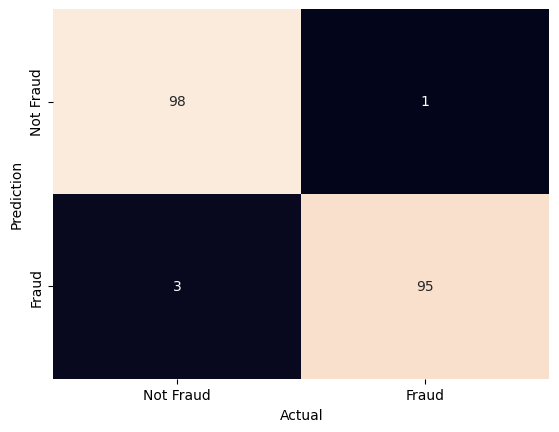

In [19]:
lr = LogisticRegression(**best_params)
lr.fit(X_train, y_train)
preds = lr.predict(X_test)
recall = recall_score(y_test, preds)
print(f"Recall Score: {recall}")

cm = confusion_matrix(y_test, preds)

sns.heatmap(cm, annot=True, fmt='g',
            xticklabels=['Not Fraud','Fraud'],
            yticklabels=['Not Fraud','Fraud'],
            cbar=False)
plt.xlabel("Actual")
plt.ylabel("Prediction")
plt.plot()